In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors

pd.options.display.float_format = '{:,.2f}'.format


col_names = ['square_id', 'province', 'time_interval',
             'square_to_prov', 'prov_to_square']
mi_prov_file = pd.read_csv('all/milano/mi-to-provinces-2013-11-01.txt',
                           sep='\t', header=None, names=col_names)
mi_prov_file.head()

,square_id,province,time_interval,square_to_prov,prov_to_square
0,1,AGRIGENTO,1383321600000,0.05,nan
1,1,AGRIGENTO,1383322200000,0.03,nan
2,1,ALESSANDRIA,1383291000000,nan,0.00
3,1,ALESSANDRIA,1383306000000,nan,0.00
4,1,ALESSANDRIA,1383320400000,0.00,nan


Step to convert time from Unix Epoch to normal format

In [2]:
mi_prov_file['datetime'] = pd.to_datetime(mi_prov_file['time_interval'], unit='ms')
mi_prov_file.head()

,square_id,province,time_interval,square_to_prov,prov_to_square,datetime
0,1,AGRIGENTO,1383321600000,0.05,nan,2013-11-01 16:00:00
1,1,AGRIGENTO,1383322200000,0.03,nan,2013-11-01 16:10:00
2,1,ALESSANDRIA,1383291000000,nan,0.00,2013-11-01 07:30:00
3,1,ALESSANDRIA,1383306000000,nan,0.00,2013-11-01 11:40:00
4,1,ALESSANDRIA,1383320400000,0.00,nan,2013-11-01 15:40:00


Calculate the bidirection activity (can be used as proxy for connection strength) and the direction of the connection

In [3]:
mi_prov_file.fillna(0, inplace=True)

mi_prov_file['total_bidirection'] = (mi_prov_file['square_to_prov']
                                    + mi_prov_file['prov_to_square'])
mi_prov_file['net_outgoing'] = (mi_prov_file['square_to_prov']
                               - mi_prov_file['prov_to_square'])

mi_prov_file.head()

,square_id,province,time_interval,square_to_prov,prov_to_square,datetime,total_bidirection,net_outgoing
0,1,AGRIGENTO,1383321600000,0.05,0.00,2013-11-01 16:00:00,0.05,0.05
1,1,AGRIGENTO,1383322200000,0.03,0.00,2013-11-01 16:10:00,0.03,0.03
2,1,ALESSANDRIA,1383291000000,0.00,0.00,2013-11-01 07:30:00,0.00,-0.00
3,1,ALESSANDRIA,1383306000000,0.00,0.00,2013-11-01 11:40:00,0.00,-0.00
4,1,ALESSANDRIA,1383320400000,0.00,0.00,2013-11-01 15:40:00,0.00,0.00


In [4]:
mi_prov_act = mi_prov_file.groupby('square_id').sum()

mi_prov_act.head()

,time_interval,square_to_prov,prov_to_square,total_bidirection,net_outgoing
square_id,,,,,
1,557475038400000,16.14,15.48,31.62,0.66
2,557475038400000,16.37,15.76,32.13,0.62
3,463410166200000,16.62,16.06,32.68,0.57
4,557475038400000,15.46,14.67,30.13,0.80
5,575458143600000,14.56,13.78,28.34,0.79


In [5]:
mi_prov_act['net_outgoing_%'] = (mi_prov_act['net_outgoing'] 
                                 / mi_prov_act['total_bidirection'] * 100)

mi_prov_act.describe()

,time_interval,square_to_prov,prov_to_square,total_bidirection,net_outgoing,net_outgoing_%
count,"10,000.00","10,000.00","10,000.00","10,000.00","10,000.00","10,000.00"
mean,"544,633,834,892,699.62",91.00,91.39,182.38,-0.39,-0.88
std,"229,404,876,124,883.12",128.40,127.78,254.98,24.86,11.16
min,"45,649,269,000,000.00",0.00,0.40,0.86,-447.37,-100.00
25%,"380,410,839,300,000.00",17.27,17.83,35.41,-2.03,-3.06
50%,"509,059,375,200,000.00",45.77,47.06,92.36,0.54,1.00
75%,"673,673,167,050,000.00",105.59,107.15,212.27,3.93,4.70
max,"2,719,587,861,600,000.00","2,130.07","2,306.89","4,376.41",466.03,48.60


Prepare the coordinate for each square id

In [6]:
col = [(id_ % 100) if (id_ % 100) !=0 else 100 for id_ in range(1, 10001)]
row = [((id_ - col_) / 100 + 1) for id_, col_ in zip(range(1, 10001), col)]

squares_loc = pd.DataFrame()
squares_loc['square_id'] = list(range(1, 10001))
squares_loc['col'] = col
squares_loc['row'] = row

mi_prov_act = mi_prov_act.merge(squares_loc, on='square_id')
display (mi_prov_act.head())

,square_id,time_interval,square_to_prov,prov_to_square,total_bidirection,net_outgoing,net_outgoing_%,col,row
0,1,557475038400000,16.14,15.48,31.62,0.66,2.10,1,1.00
1,2,557475038400000,16.37,15.76,32.13,0.62,1.92,2,1.00
2,3,463410166200000,16.62,16.06,32.68,0.57,1.73,3,1.00
3,4,557475038400000,15.46,14.67,30.13,0.80,2.65,4,1.00
4,5,575458143600000,14.56,13.78,28.34,0.79,2.77,5,1.00


In [7]:
col = mi_prov_act.columns.drop(['square_id', 'time_interval', 'col', 'row'])

print (col)

Index(['square_to_prov', 'prov_to_square', 'total_bidirection', 'net_outgoing',
       'net_outgoing_%'],
      dtype='object')


Plot the distribution of the variables

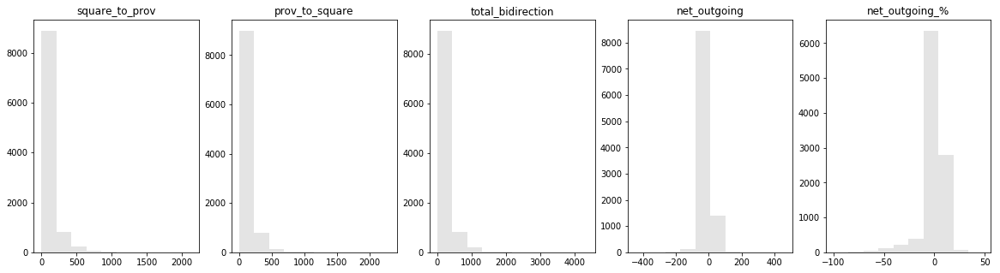

In [8]:
fig, ax = plt.subplots(ncols=5, figsize=(20, 5))

for i, c in enumerate(col):
    ax[i].hist(mi_prov_act[c], facecolor='lightgrey', alpha=0.6)
    ax[i].set_title(c)
        
plt.show()

Apply cube root to reduce skewness. However, this result in a bimodal distribution for net_outgoing_% (strength of direction)

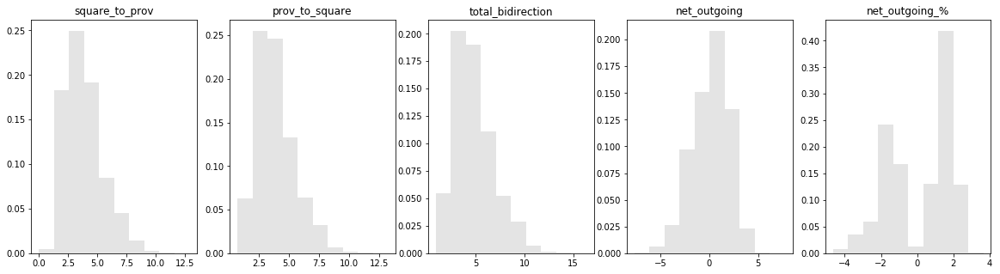

In [9]:
fig, ax = plt.subplots(ncols=5, figsize=(20, 5))

for i, c in enumerate(col):
    ax[i].hist(np.cbrt(mi_prov_act[c]), density=True, 
               facecolor='lightgrey', alpha=0.6)
    ax[i].set_title(c)
#     ax[i].set_xscale('log')
        
plt.show()

Map the data of each square to the coordinate, with the size indicating total activity, while the color indicate direction (red = more incoming). Because the net % as calculated above show high skew towards the negative direction, a symmetric log normal is used to ensure that incoming remain on the red side. This has the effect of making color on 2 side of the scale non-comparable (blue cannot be compared to red, but blue vs blue is OK)

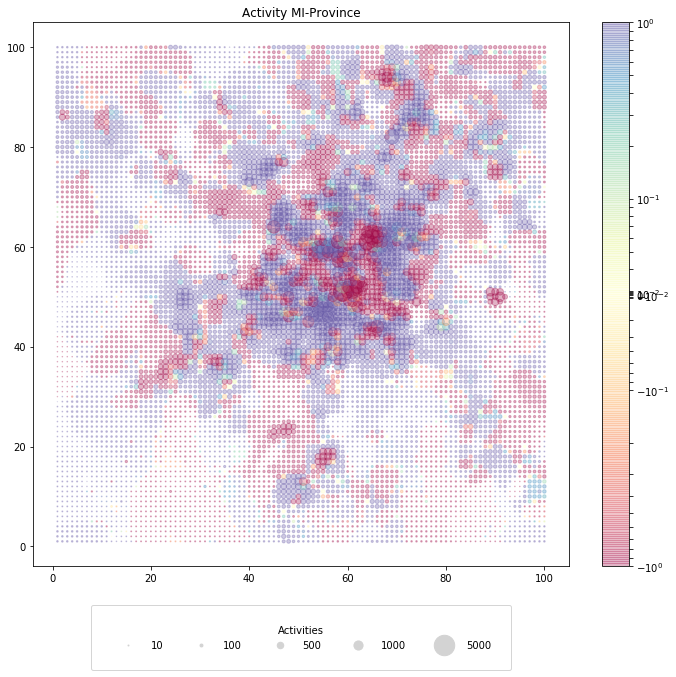

In [10]:
def plot_square_coor(df, s_col, c_col, title):
    """
    Plot the square on a 100x100 board to visualize activity
    """
#     n_min = df[c_col].quantile(0.2)
#     n_max = df[c_col].quantile(0.8)
    plot = plt.scatter(x=df['col'], y=df['row'], 
                       s=df[s_col]/12, c=df[c_col], 
                       norm=colors.SymLogNorm(linthresh=0.03, linscale=0.03, 
                                              vmin=-1, vmax=1), 
                       cmap='Spectral', alpha=0.3)    
    plt.title(title)
    plt.colorbar(plot)
    legend_label = [10, 100, 500, 1000, 5000]
    legend_box = [plt.scatter([], [], s=i/12, c='lightgrey') for i in legend_label]
    plt.legend(legend_box, legend_label, bbox_to_anchor=(0.5, -0.2), 
               ncol=5, handlelength=3.5, loc=8, borderpad=2, 
               handletextpad=0.5, title='Activities')

fig, ax = plt.subplots(figsize=(12, 10))
plot_square_coor(mi_prov_act, 
                 'total_bidirection', 'net_outgoing_%',
                 'Activity MI-Province')
plt.show()

The map show that there are 4-5 heavy 'receiver' areas (more incoming) and 1-2 heavy 'sender' area. Out of the 'receivers': city center, shopping district and the airport

Method for classifying a square_id purpose: using attributes or the difference between some attributes of a square id vs its neighbour

Attributes to consider: activity direction, activity scale, distance to the center, difference in top contacts, difference in quality of top contacts

In [11]:
def top_contact_prov(mi_prov_data, var):
    """
    Identify the top province in the contact, ranking 
    by variable ('total_bidirection' or 'net_outgoing')
    """
    top = mi_prov_data.groupby('province').sum()
    if var == 'net_outgoing':
        top['net_outgoing_%'] = (top['net_outgoing']
                                 / top['total_bidirection'] * 100)
        result = top.sort_values('net_outgoing_%', ascending=True)
    else:
        result = top.sort_values('total_bidirection', ascending=False)
    return result
    
display (top_contact_prov(mi_prov_file, 'total_bidirection').head())
display (top_contact_prov(mi_prov_file, 'net_outgoing').head())

,square_id,time_interval,square_to_prov,prov_to_square,total_bidirection,net_outgoing
province,,,,,,
MILANO,5557897771,1529474870409773056,"654,074.13","656,782.17","1,310,856.30","-2,708.04"
MONZA E DELLA BRIANZA,1637643415,342949335132000000,"34,834.68","35,019.51","69,854.19",-184.83
PAVIA,782617019,311930192761800000,"15,568.08","16,928.81","32,496.89","-1,360.74"
NAPOLI,627485099,174156668227800000,"13,042.79","12,159.48","25,202.27",883.31
BERGAMO,717874914,175327921459800000,"11,019.85","11,459.11","22,478.95",-439.26


,square_id,time_interval,square_to_prov,prov_to_square,total_bidirection,net_outgoing,net_outgoing_%
province,,,,,,,
ASTI,26281229,7550119285200000,263.52,540.64,804.17,-277.12,-34.46
ALESSANDRIA,86709062,27829460542800000,"1,043.89","1,976.75","3,020.64",-932.86,-30.88
PRATO,23086324,6119792214600000,384.69,554.42,939.11,-169.72,-18.07
MESSINA,111757412,29161673706600000,"1,564.48","2,087.93","3,652.41",-523.45,-14.33
ORISTANO,12516553,3007332498000000,141.85,188.83,330.68,-46.99,-14.21


Checking top contacts based on both direction as well as only the outgoing direction give different pictures: most activity by far and large is internal (within Milan province and Lombardy area). Outgoing activity are more likely to go outside Lombardy.

In [12]:
median_square_activity = mi_prov_act.loc[:, 'total_bidirection'].median()

print (median_square_activity)

92.36474345203762


Split the squares into quantile based on their activity to the province to see if there's any difference

In [13]:
no_act, low_act, mi_act, hi_act, top_act = (mi_prov_act.loc[:, 'total_bidirection']
                                                       .quantile([0, 0.25, 0.5, 0.75, 1]))

def activity_div(lower, upper, name):
    satisfy_cond = ((mi_prov_act.loc[:, 'total_bidirection'] >= lower)
                    & (mi_prov_act.loc[:, 'total_bidirection'] < upper))
    mi_prov_act.loc[satisfy_cond, 'act_group'] = name

activity_div(no_act, low_act, 'low_activity')
activity_div(low_act, mi_act, 'mild_activity')
activity_div(mi_act, hi_act, 'high_activity')
activity_div(hi_act, top_act, 'center')

mi_prov_grp = {}
for grp in ['center', 'high_activity', 'mild_activity', 'low_activity']:
    is_in_grp = mi_prov_act['act_group'] == grp
    activity_ids = (mi_prov_file.loc[:, 'square_id']
                                .isin(mi_prov_act.loc[is_in_grp, 'square_id'])
                   )
    mi_prov_grp[grp] = mi_prov_file.loc[activity_ids]

for grp in ['center', 'high_activity', 'mild_activity', 'low_activity']:
    display (top_contact_prov(mi_prov_grp[grp], 'total_bidirection').head())

,square_id,time_interval,square_to_prov,prov_to_square,total_bidirection,net_outgoing
province,,,,,,
MILANO,1836921509,422666830285800000,"452,139.98","451,108.72","903,248.69","1,031.26"
MONZA E DELLA BRIANZA,608052328,121959779672400000,"19,732.39","19,608.53","39,340.92",123.86
PAVIA,282040477,76136169715200000,"9,227.56","9,937.99","19,165.55",-710.42
NAPOLI,274434202,66370088676000000,"9,576.16","8,666.19","18,242.35",909.97
BERGAMO,275342095,60997181274000000,"7,099.20","7,505.02","14,604.22",-405.82


,square_id,time_interval,square_to_prov,prov_to_square,total_bidirection,net_outgoing
province,,,,,,
MILANO,1736136768,390912048652200000,"127,383.31","129,406.12","256,789.43","-2,022.81"
MONZA E DELLA BRIANZA,659668613,119165383339200000,"12,413.47","12,503.20","24,916.67",-89.73
PAVIA,207652661,62906168964000000,"3,067.86","3,357.27","6,425.13",-289.41
BERGAMO,254139640,52747106745000000,"2,605.02","2,647.04","5,252.06",-42.02
NAPOLI,187838248,44845724921400000,"2,187.70","2,120.84","4,308.54",66.86


,square_id,time_interval,square_to_prov,prov_to_square,total_bidirection,net_outgoing
province,,,,,,
MILANO,1333233384,375304267427400000,"54,300.04","56,675.27","110,975.31","-2,375.22"
MONZA E DELLA BRIANZA,285712276,66468110740800000,"2,192.65","2,371.21","4,563.86",-178.57
PAVIA,177122462,70991627977800000,"1,861.89","2,111.16","3,973.05",-249.27
BERGAMO,147828550,37875084066000000,988.71,"1,021.46","2,010.18",-32.75
VARESE,165177887,38161443779400000,901.64,"1,078.42","1,980.05",-176.78


,square_id,time_interval,square_to_prov,prov_to_square,total_bidirection,net_outgoing
province,,,,,,
MILANO,650986790,340425726985200000,"18,853.19","18,126.86","36,980.04",726.33
PAVIA,115574335,101835360255600000,"1,367.92","1,467.54","2,835.46",-99.62
MONZA E DELLA BRIANZA,83988275,35296578948600000,444.38,489.63,934.01,-45.26
LODI,32887150,27367452417600000,355.06,389.96,745.02,-34.90
VARESE,58277240,26240054425200000,325.08,321.25,646.33,3.84


![](https://upload.wikimedia.org/wikipedia/commons/a/a0/Italian_regions_provinces.svg)

There's not much deviation in top 3 (Milan, Pavia, Monza) 

In [14]:
for grp in ['center', 'high_activity', 'mild_activity', 'low_activity']:
    display (top_contact_prov(mi_prov_grp[grp], 'net_outgoing').head())

,square_id,time_interval,square_to_prov,prov_to_square,total_bidirection,net_outgoing,net_outgoing_%
province,,,,,,,
ASTI,11241887,2720975902200000,171.78,367.75,539.52,-195.97,-36.32
ALESSANDRIA,36536655,9730227882600000,734.42,"1,390.07","2,124.50",-655.65,-30.86
PRATO,10115081,2225759713200000,254.55,389.34,643.89,-134.79,-20.93
BELLUNO,12121518,2994873156600000,295.81,398.73,694.54,-102.92,-14.82
VICENZA,30313043,6862617351000000,673.84,898.18,"1,572.02",-224.35,-14.27


,square_id,time_interval,square_to_prov,prov_to_square,total_bidirection,net_outgoing,net_outgoing_%
province,,,,,,,
MEDIO CAMPIDANO,1294009,225480711000000,6.74,15.29,22.03,-8.56,-38.85
ALESSANDRIA,23442637,6154358003400000,185.37,340.84,526.21,-155.48,-29.55
ASTI,7604629,1752656245200000,55.91,99.37,155.28,-43.46,-27.99
PRATO,6882041,1554853246800000,64.12,104.65,168.76,-40.53,-24.02
MESSINA,32533222,7530771180600000,223.15,355.87,579.02,-132.72,-22.92


,square_id,time_interval,square_to_prov,prov_to_square,total_bidirection,net_outgoing,net_outgoing_%
province,,,,,,,
ORISTANO,2212873,569924968200000,4.30,21.70,26.00,-17.40,-66.92
MEDIO CAMPIDANO,811159,189514541400000,1.93,6.89,8.82,-4.96,-56.27
GORIZIA,2854800,647390248200000,7.22,24.61,31.83,-17.39,-54.65
ASTI,5381245,1747122641400000,19.30,53.39,72.69,-34.09,-46.90
OLBIA-TEMPIO,9877762,3236924758200000,49.67,133.12,182.79,-83.45,-45.65


,square_id,time_interval,square_to_prov,prov_to_square,total_bidirection,net_outgoing,net_outgoing_%
province,,,,,,,
MEDIO CAMPIDANO,197867,37349819400000,0.01,1.37,1.38,-1.37,-99.13
ORISTANO,1188808,373492249800000,0.63,9.24,9.88,-8.61,-87.15
L'AQUILA,1317410,814776625200000,2.18,12.16,14.34,-9.99,-69.66
NUORO,844032,207497168400000,0.82,3.73,4.56,-2.91,-63.82
GORIZIA,443039,195046179600000,1.38,4.36,5.74,-2.98,-51.85


Interestingly, for top activity provinces most of the outgoing connection is within the North regions. For lower activity provinces outgoing interaction is mostly with Sardinia (the island) and the South

>After World War II, Milan experienced two main waves of immigration: the first, dating from the 1950s to the early 1970s, saw a large influx of migrants from ***poorer and rural areas*** within Italy; the second, starting from the late 1980s, has been characterised by the preponderance of foreign-born immigrants. The early period ... brought to the city a large influx of over 400,000 people, mainly from rural and overpopulated ***Southern Italy***.

The data suggest a concentration of early immigrant community: either old people from the rural provinces or their descendants (who lives in the same areas). In both case this imply a low income.

# TL; DR
The data include measures of call/sms activity in each square id of the city of Milan. We calculate the total_bidirection, which can be used to cluster the square id based on spatial correlation. The distance to the center can be used to proxy for the purpose of each square, while the difference in top outgoing contacts (North/South) can be used to estimate the level of affluence.

In [15]:
col_names = ['square_id', 'time_interval', 'country_code',
             'sms_in', 'sms_out', 'call_in', 'call_out', 'internet_traffic']

mi_file = pd.read_csv('all/milano/sms-call-internet-mi-2013-11-01.txt',
                      sep='\t', header=None, names=col_names)
mi_file.head()

,square_id,time_interval,country_code,sms_in,sms_out,call_in,call_out,internet_traffic
0,1,1383260400000,0,0.08,nan,nan,nan,nan
1,1,1383260400000,39,0.14,0.16,0.16,0.05,11.03
2,1,1383261000000,0,0.14,nan,nan,0.03,nan
3,1,1383261000000,33,nan,nan,nan,nan,0.03
4,1,1383261000000,39,0.28,0.12,0.19,0.13,11.10


In [16]:
mi_file.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4842625 entries, 0 to 4842624
Data columns (total 8 columns):
square_id           int64
time_interval       int64
country_code        int64
sms_in              float64
sms_out             float64
call_in             float64
call_out            float64
internet_traffic    float64
dtypes: float64(5), int64(3)
memory usage: 295.6 MB


Adding some calculations

In [17]:
mi_file['datetime'] = pd.to_datetime(mi_file['time_interval'], unit='ms')
mi_file.fillna(0, inplace=True)

mi_file['total_bidirection_sms'] = mi_file['sms_in'] + mi_file['sms_out']
mi_file['total_bidirection_call'] = mi_file['call_in'] + mi_file['call_out']
mi_file['activity_in'] = mi_file['sms_in'] + mi_file['call_in']
mi_file['activity_out'] = mi_file['sms_out'] + mi_file['call_out']
mi_file['net_outgoing_call'] = mi_file['call_out'] - mi_file['call_in']
mi_file['net_outgoing_sms'] = mi_file['sms_out'] - mi_file['sms_in']
mi_file['net_out_call_sms'] = mi_file['activity_out'] - mi_file['activity_in']
mi_file['total_call_sms'] = (mi_file['sms_in'] + mi_file['sms_out'] 
                             + mi_file['call_in'] + mi_file['call_out'])

mi_file.head()

,square_id,time_interval,country_code,sms_in,sms_out,call_in,call_out,internet_traffic,datetime,total_bidirection_sms,total_bidirection_call,activity_in,activity_out,net_outgoing_call,net_outgoing_sms,net_out_call_sms,total_call_sms
0,1,1383260400000,0,0.08,0.00,0.00,0.00,0.00,2013-10-31 23:00:00,0.08,0.00,0.08,0.00,0.00,-0.08,-0.08,0.08
1,1,1383260400000,39,0.14,0.16,0.16,0.05,11.03,2013-10-31 23:00:00,0.30,0.21,0.30,0.21,-0.11,0.01,-0.09,0.51
2,1,1383261000000,0,0.14,0.00,0.00,0.03,0.00,2013-10-31 23:10:00,0.14,0.03,0.14,0.03,0.03,-0.14,-0.11,0.16
3,1,1383261000000,33,0.00,0.00,0.00,0.00,0.03,2013-10-31 23:10:00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
4,1,1383261000000,39,0.28,0.12,0.19,0.13,11.10,2013-10-31 23:10:00,0.40,0.32,0.47,0.25,-0.06,-0.16,-0.21,0.72


In [18]:
mi_file.loc[:, 'country_code'].value_counts().head(10)

39     1439981
0      1159632
33      210334
46      208713
49      165341
20      155336
41      145551
44      117362
40       98367
380      82571
Name: country_code, dtype: int64

Checking for irregularities

In [19]:
mi_file.sort_values('net_outgoing_call').head(10)

,square_id,time_interval,country_code,sms_in,sms_out,call_in,call_out,internet_traffic,datetime,total_bidirection_sms,total_bidirection_call,activity_in,activity_out,net_outgoing_call,net_outgoing_sms,net_out_call_sms,total_call_sms
2133385,5161,1383325800000,39,151.03,72.10,190.99,131.35,"4,509.69",2013-11-01 17:10:00,223.13,322.34,342.02,203.45,-59.64,-78.93,-138.57,545.46
2133122,5161,1383320400000,39,202.72,91.88,178.50,126.56,"4,580.27",2013-11-01 15:40:00,294.60,305.06,381.21,218.44,-51.94,-110.84,-162.77,599.65
2637579,5957,1383299400000,39,29.97,17.22,70.14,23.55,588.32,2013-11-01 09:50:00,47.19,93.69,100.11,40.77,-46.58,-12.75,-59.34,140.88
2133179,5161,1383321600000,39,176.19,104.88,188.80,144.89,"4,449.87",2013-11-01 16:00:00,281.07,333.69,364.99,249.77,-43.91,-71.31,-115.22,614.76
1714872,4464,1383269400000,39,1.32,2.28,49.97,7.18,195.78,2013-11-01 01:30:00,3.60,57.15,51.29,9.46,-42.79,0.97,-41.83,60.75
3896221,8169,1383319200000,39,31.79,8.36,71.02,28.96,794.76,2013-11-01 15:20:00,40.15,99.98,102.81,37.32,-42.06,-23.43,-65.49,140.12
2200060,5262,1383322200000,39,67.44,56.73,91.93,50.45,"1,548.99",2013-11-01 16:10:00,124.17,142.39,159.37,107.18,-41.48,-10.71,-52.19,266.56
2135081,5162,1383318600000,39,72.22,50.17,80.37,42.71,"1,790.59",2013-11-01 15:10:00,122.39,123.08,152.59,92.88,-37.67,-22.05,-59.71,245.47
1714869,4464,1383268800000,39,3.93,8.05,38.93,2.28,165.17,2013-11-01 01:20:00,11.98,41.21,42.86,10.34,-36.65,4.12,-32.52,53.19
2132951,5161,1383316800000,39,147.49,72.50,141.93,106.03,"3,529.08",2013-11-01 14:40:00,219.99,247.96,289.42,178.53,-35.90,-74.99,-110.89,467.95


In [20]:
mi_file.sort_values('net_outgoing_sms').head(10)

,square_id,time_interval,country_code,sms_in,sms_out,call_in,call_out,internet_traffic,datetime,total_bidirection_sms,total_bidirection_call,activity_in,activity_out,net_outgoing_call,net_outgoing_sms,net_out_call_sms,total_call_sms
2133345,5161,1383325200000,0,193.10,2.70,0.00,0.00,0.00,2013-11-01 17:00:00,195.80,0.00,193.10,2.70,0.00,-190.41,-190.41,195.80
2646118,5965,1383264600000,0,234.02,44.25,0.00,3.23,0.00,2013-11-01 00:10:00,278.27,3.23,234.02,47.47,3.23,-189.77,-186.54,281.49
2133141,5161,1383321000000,0,174.47,1.25,0.00,0.02,0.00,2013-11-01 15:50:00,175.72,0.02,174.47,1.27,0.02,-173.23,-173.20,175.75
2646122,5965,1383265200000,0,205.32,42.30,0.00,0.00,0.00,2013-11-01 00:20:00,247.62,0.00,205.32,42.30,0.00,-163.02,-163.02,247.62
2133028,5161,1383318600000,0,158.09,0.00,0.00,4.89,0.00,2013-11-01 15:10:00,158.09,4.89,158.09,4.89,4.89,-158.09,-153.20,162.98
2133058,5161,1383319200000,0,174.37,18.60,0.42,5.20,0.00,2013-11-01 15:20:00,192.97,5.62,174.79,23.80,4.77,-155.76,-150.99,198.59
2133319,5161,1383324600000,0,156.99,2.45,0.00,2.75,0.00,2013-11-01 16:50:00,159.44,2.75,156.99,5.20,2.75,-154.55,-151.80,162.19
2133111,5161,1383320400000,0,167.75,13.34,0.00,2.75,0.00,2013-11-01 15:40:00,181.09,2.75,167.75,16.09,2.75,-154.41,-151.66,183.84
2133232,5161,1383322800000,0,154.29,0.20,0.00,0.00,0.00,2013-11-01 16:20:00,154.49,0.00,154.29,0.20,0.00,-154.09,-154.09,154.49
2646334,5965,1383286200000,0,185.98,34.04,0.00,0.00,0.00,2013-11-01 06:10:00,220.01,0.00,185.98,34.04,0.00,-151.94,-151.94,220.01


Knowing the information about immigrants we are interested in seeing if second-wave immigrants (external) show any difference vs first-wave (internal). Since we have country code we can identify each country separately.

In [21]:
mi_file.loc[:, 'first_digit'] = mi_file.loc[:, 'country_code'].apply(lambda x: str(x)[0])

first_digit = ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']
country = ['Unknown', 'NA', 'AF', 'EU', 'EU', 'SA', 'AP', 'RU', 'EA', 'ME']

for dgt, ctry in zip(first_digit, country):
        mi_file.loc[mi_file['first_digit'] == dgt, 'country'] = ctry

display (mi_file.groupby('country')['total_call_sms'].sum())

country
AF            75,381.26
AP            20,280.27
EA            42,814.52
EU        11,330,000.84
ME            26,569.58
NA            15,712.56
RU            22,003.16
SA            16,470.40
Unknown    1,699,147.03
Name: total_call_sms, dtype: float64

Most call are from EU numbers but Africa and East Asia also feature in the top. We can map the country in each square id to their respective coordinate

In [22]:
def net_pc_calc(df):
    df['net_out_%'] = (df['net_out_call_sms'] 
                       / df['total_call_sms'] * 100)
    df['net_outcall_%'] = (df['net_outgoing_call'] 
                           / df['total_bidirection_call'] * 100)
    df['net_outsms_%'] = (df['net_outgoing_sms'] 
                          / df['total_bidirection_sms'] * 100)
    return df

def map_to_square(df, var, var_list):
    """
    Create a dict of dataframe, each dataframe is a slice 
    of df that are mapped on to square coordinate. Additional 
    calculation are for the net % out to indicate 
    activity direction
    """
    map_ = {}
    main_var = var[0]
    var.insert(0, 'square_id')
    mi_map = df.groupby(var).sum().reset_index()
    for v in var_list:
        map_[v] = mi_map.loc[mi_map[main_var]==v]
        if 'col' not in mi_map.columns:
            map_[v] = map_[v].merge(squares_loc, on='square_id')
        map_[v] = net_pc_calc(map_[v])
    return map_, mi_map

In [61]:
ctr_map, mi_by_country = map_to_square(mi_file, ['country'], country)

display (mi_by_country.groupby('country').sum()
                      .sort_values('total_bidirection_call', 
                                   ascending=False)
                      .loc[:, ['total_bidirection_call']])

display (mi_by_country.groupby('country').sum()
                      .sort_values('total_bidirection_sms', 
                                   ascending=False)
                      .loc[:, ['total_bidirection_sms']])

display (mi_by_country.groupby('country').sum()
                      .sort_values('internet_traffic', 
                                   ascending=False)
                      .loc[:, ['internet_traffic']])

,total_bidirection_call
country,
EU,"5,599,386.34"
Unknown,"81,043.25"
AF,"59,703.04"
EA,"31,406.96"
ME,"15,980.23"
SA,"11,289.36"
AP,"10,140.88"
RU,"6,552.68"
NA,"4,059.45"


,total_bidirection_sms
country,
EU,"5,730,614.50"
Unknown,"1,618,103.78"
AF,"15,678.22"
RU,"15,450.47"
NA,"11,653.11"
EA,"11,407.56"
ME,"10,589.35"
AP,"10,139.39"
SA,"5,181.04"


,internet_traffic
country,
EU,"82,435,896.78"
NA,"13,930.63"
EA,"8,812.65"
ME,"7,185.57"
RU,"5,726.51"
SA,"4,193.41"
AP,"2,088.97"
AF,"1,391.33"
Unknown,20.74


Apparently, African call ans text a lot but do not use Internet, Russian text a lot but do not call, and East Asian and North American prefer to use Internet

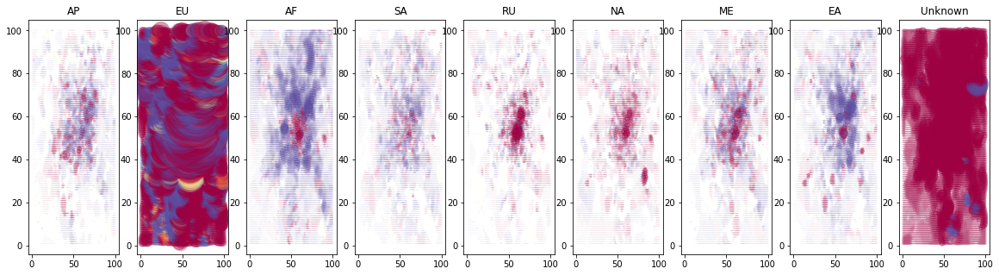

In [24]:
country_u = list(set(country))

def plot_map(data, s_col, c_col, var_list):
    """
    Plot multiple slices of the data for each variable in 
    var_list onto a square coordinate
    """
    for i, var in enumerate(var_list):
#         n_min = df[var][c_col].quantile(0.25)
#         n_max = df[var][c_col].quantile(0.75)
        ax[i].scatter(x=data[var]['col'], y=data[var]['row'], 
                      s=data[var][s_col]/4, c=data[var][c_col], 
                      norm=colors.SymLogNorm(linthresh=0.03, linscale=0.03, 
                                             vmin=-1, vmax=1), 
                      cmap='Spectral', alpha=0.2)
        ax[i].set_title(var)
        
fig, ax = plt.subplots(ncols=len(country_u), figsize=(20, 5))
plot_map(ctr_map, 'total_call_sms', 'net_out_%', country_u)
plt.show()

The people who use phone number of a different country (and accept roaming charge) are temporary residents (tourist, new immigrants...). Cluster of them can therefore indicate a sightseeing/shopping place or transportation hub

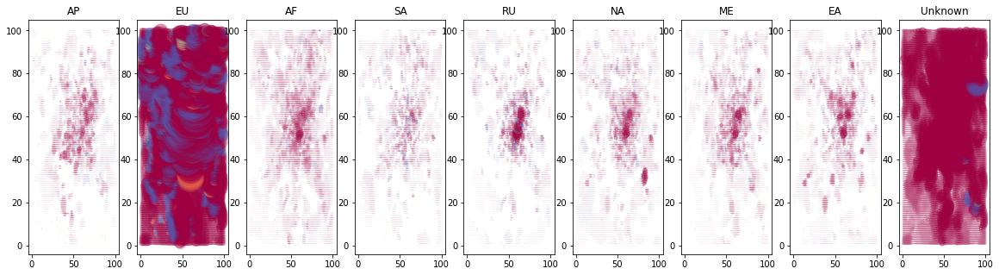

In [25]:
fig, ax = plt.subplots(ncols=len(country_u), figsize=(20, 5))
plot_map(ctr_map, 'total_bidirection_sms', 'net_outsms_%', country_u)
plt.show()

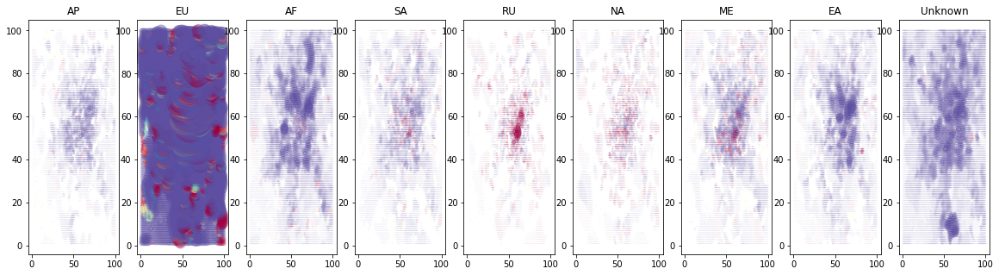

In [26]:
fig, ax = plt.subplots(ncols=len(country_u), figsize=(20, 5))
plot_map(ctr_map, 'total_bidirection_call', 'net_outcall_%', country_u)
plt.show()

Unlike call and text, Internet use for non-resident are less spread out, concentrating in the city center and directly above the center. This is a potential indicator of income - people that come from countries that have data roaming with Italy operator are more likely to be high earner

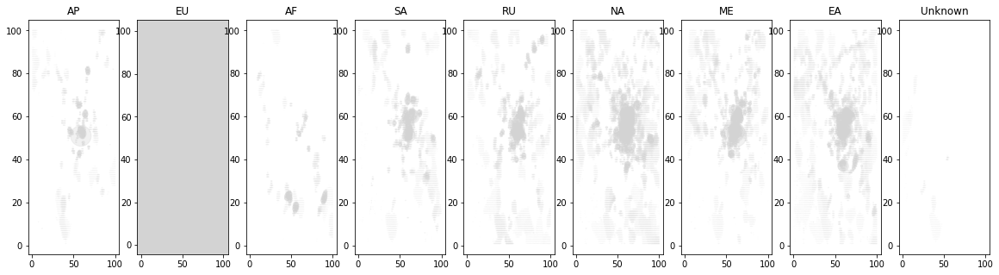

In [27]:
def plot_map_internet(df, var_list, s_adj=1):
    for i, var in enumerate(var_list):
        ax[i].scatter(x=df[var]['col'], y=df[var]['row'], 
                      s=df[var]['internet_traffic']/s_adj, 
                      c='lightgrey', alpha=0.3)
        ax[i].set_title(var)

fig, ax = plt.subplots(ncols=len(country_u), figsize=(20, 5))
plot_map_internet(ctr_map, country_u)
plt.show()

We want to compare the activity of each square id in a day as a baseline, then we will try to see if different timing impact overall usage behaviour

In [28]:
mi_total_act = mi_file.groupby('square_id').sum()

mi_total_act.head()

,time_interval,country_code,sms_in,sms_out,call_in,call_out,internet_traffic,total_bidirection_sms,total_bidirection_call,activity_in,activity_out,net_outgoing_call,net_outgoing_sms,net_out_call_sms,total_call_sms
square_id,,,,,,,,,,,,,,,
1,478624264800000,14990,78.71,45.89,41.11,48.25,"1,507.05",124.60,89.35,119.82,94.13,7.14,-32.82,-25.69,213.95
2,478624264800000,14990,79.85,46.48,41.74,49.14,"1,512.86",126.33,90.88,121.59,95.62,7.39,-33.37,-25.97,217.21
3,457874651400000,14179,81.06,47.11,42.42,50.09,"1,519.05",128.17,92.50,123.47,97.20,7.67,-33.94,-26.27,220.67
4,478624264800000,14990,75.42,44.17,39.27,45.66,"1,490.22",119.58,84.94,114.69,89.83,6.39,-31.25,-24.86,204.52
5,489690669600000,15895,70.11,41.05,36.86,42.79,"1,356.85",111.17,79.65,106.97,83.84,5.93,-29.06,-23.13,190.82


In [29]:
def net_calc(df):  
    df['net_outcall_%'] = (df['net_outgoing_call'] 
                           / df['total_bidirection_call'] * 100)
    df['net_outsms_%'] = (df['net_outgoing_sms'] 
                          / df['total_bidirection_sms'] * 100)
    df['net_out_%'] = (df['net_out_call_sms'] 
                       / df['total_call_sms'] * 100)
    df = df.merge(squares_loc, on='square_id')
    return df

mi_total_act = net_calc(mi_total_act)
mi_total_act.head()

,square_id,time_interval,country_code,sms_in,sms_out,call_in,call_out,internet_traffic,total_bidirection_sms,total_bidirection_call,...,activity_out,net_outgoing_call,net_outgoing_sms,net_out_call_sms,total_call_sms,net_outcall_%,net_outsms_%,net_out_%,col,row
0,1,478624264800000,14990,78.71,45.89,41.11,48.25,"1,507.05",124.60,89.35,...,94.13,7.14,-32.82,-25.69,213.95,7.99,-26.34,-12.01,1,1.00
1,2,478624264800000,14990,79.85,46.48,41.74,49.14,"1,512.86",126.33,90.88,...,95.62,7.39,-33.37,-25.97,217.21,8.14,-26.41,-11.96,2,1.00
2,3,457874651400000,14179,81.06,47.11,42.42,50.09,"1,519.05",128.17,92.50,...,97.20,7.67,-33.94,-26.27,220.67,8.29,-26.48,-11.91,3,1.00
3,4,478624264800000,14990,75.42,44.17,39.27,45.66,"1,490.22",119.58,84.94,...,89.83,6.39,-31.25,-24.86,204.52,7.52,-26.13,-12.16,4,1.00
4,5,489690669600000,15895,70.11,41.05,36.86,42.79,"1,356.85",111.17,79.65,...,83.84,5.93,-29.06,-23.13,190.82,7.44,-26.14,-12.12,5,1.00


In [30]:
mi_total_act.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 0 to 9999
Data columns (total 21 columns):
square_id                 10000 non-null int64
time_interval             10000 non-null int64
country_code              10000 non-null int64
sms_in                    10000 non-null float64
sms_out                   10000 non-null float64
call_in                   10000 non-null float64
call_out                  10000 non-null float64
internet_traffic          10000 non-null float64
total_bidirection_sms     10000 non-null float64
total_bidirection_call    10000 non-null float64
activity_in               10000 non-null float64
activity_out              10000 non-null float64
net_outgoing_call         10000 non-null float64
net_outgoing_sms          10000 non-null float64
net_out_call_sms          10000 non-null float64
total_call_sms            10000 non-null float64
net_outcall_%             10000 non-null float64
net_outsms_%              9998 non-null float64
net_out_%        

In [31]:
mi_total_act.loc[mi_total_act['net_outsms_%'].isnull()]

,square_id,time_interval,country_code,sms_in,sms_out,call_in,call_out,internet_traffic,total_bidirection_sms,total_bidirection_call,...,activity_out,net_outgoing_call,net_outgoing_sms,net_out_call_sms,total_call_sms,net_outcall_%,net_outsms_%,net_out_%,col,row
5238,5239,356893588800000,17936,0.00,0.00,0.00,476.19,47.79,0.00,476.19,...,476.19,476.19,0.00,476.19,476.19,100.00,nan,100.00,39,53.00
5338,5339,449575316400000,23915,0.00,0.00,0.00,487.50,79.57,0.00,487.50,...,487.50,487.50,0.00,487.50,487.50,100.00,nan,100.00,39,54.00


In [32]:
mi_total_act['net_outsms_%'].fillna(0, inplace=True)

mi_total_act.describe()

,square_id,time_interval,country_code,sms_in,sms_out,call_in,call_out,internet_traffic,total_bidirection_sms,total_bidirection_call,...,activity_out,net_outgoing_call,net_outgoing_sms,net_out_call_sms,total_call_sms,net_outcall_%,net_outsms_%,net_out_%,col,row
count,"10,000.00","10,000.00","10,000.00","10,000.00","10,000.00","10,000.00","10,000.00","10,000.00","10,000.00","10,000.00",...,"10,000.00","10,000.00","10,000.00","10,000.00","10,000.00","10,000.00","10,000.00","10,000.00","10,000.00","10,000.00"
mean,"5,000.50","669,883,927,369,856.88","84,546.10",460.64,282.24,262.28,319.68,"8,247.92",742.88,581.96,...,601.92,57.40,-178.40,-121.00,"1,324.84",9.32,-24.34,-8.45,50.50,50.50
std,"2,886.90","248,266,154,212,358.06","105,833.31",716.67,457.91,384.84,465.26,"12,293.34","1,130.57",845.49,...,879.19,119.53,410.36,367.06,"1,952.55",10.36,15.41,11.42,28.87,28.87
min,1.00,"257,294,832,000,000.00","5,740.00",0.00,0.00,0.00,1.31,47.79,0.00,2.47,...,2.22,-412.49,"-10,784.92","-10,627.85",5.15,-21.91,-81.50,-64.90,1.00,1.00
25%,"2,500.75","502,141,353,450,000.00","22,098.50",85.56,51.74,49.30,60.01,"1,666.19",141.61,110.53,...,122.42,5.33,-205.95,-152.44,258.45,4.29,-33.16,-14.35,25.75,25.75
50%,"5,000.50","622,488,727,500,000.00","39,799.00",225.79,130.72,129.49,158.20,"4,224.11",359.68,288.04,...,295.09,20.88,-81.86,-56.93,649.32,7.25,-26.96,-11.49,50.50,50.50
75%,"7,500.25","770,501,681,850,000.00","108,548.00",506.43,307.41,300.56,360.54,"9,102.35",836.32,659.56,...,684.70,59.19,-22.97,-11.62,"1,526.21",10.62,-19.27,-6.31,75.25,75.25
max,"10,000.00","3,310,259,745,600,000.00","833,211.00","16,448.39","8,343.75","7,650.49","8,974.39","237,230.39","22,296.94","15,522.64",...,"16,506.27","2,426.14","7,051.09","7,078.46","37,819.57",100.00,86.22,100.00,100.00,100.00


In [33]:
col = mi_total_act.columns.drop(['square_id','time_interval', 
                                 'col', 'row', 'country_code',])

print (len(col))
print (col)

16
Index(['sms_in', 'sms_out', 'call_in', 'call_out', 'internet_traffic',
       'total_bidirection_sms', 'total_bidirection_call', 'activity_in',
       'activity_out', 'net_outgoing_call', 'net_outgoing_sms',
       'net_out_call_sms', 'total_call_sms', 'net_outcall_%', 'net_outsms_%',
       'net_out_%'],
      dtype='object')


Print out the frequency of each observation

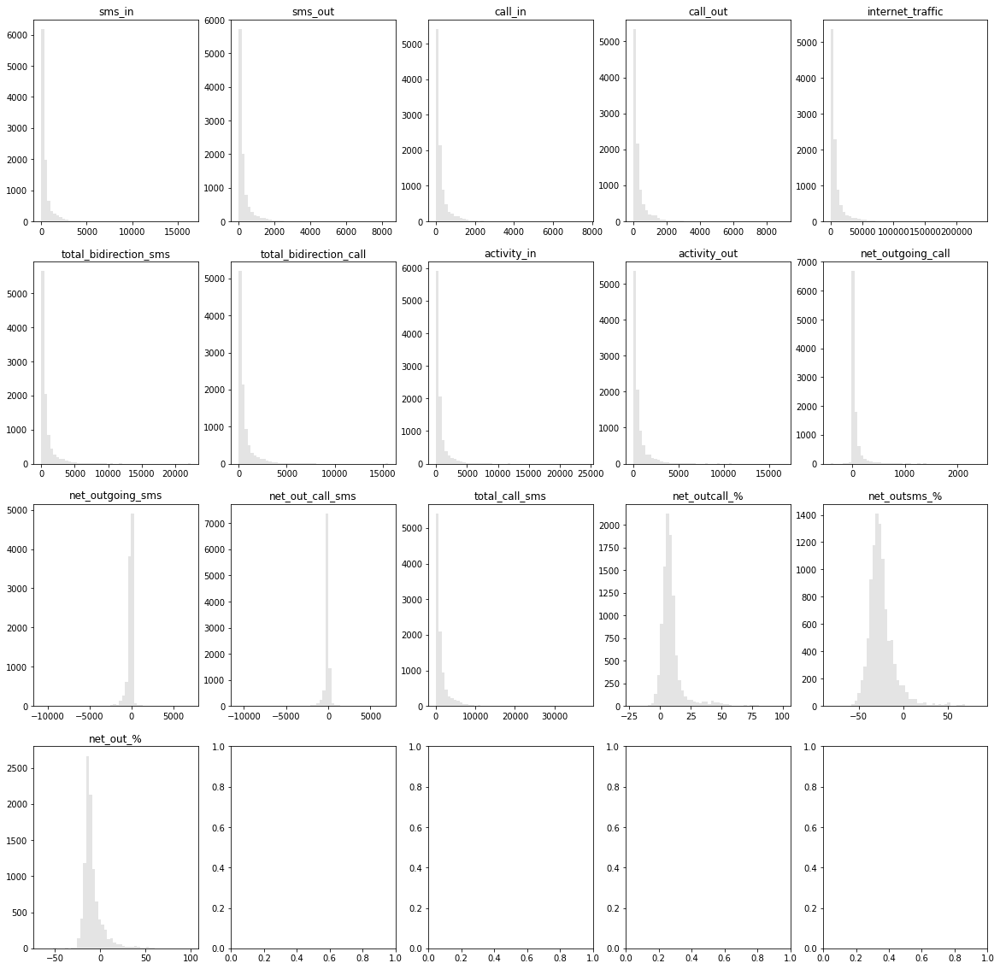

In [34]:
fig, ax = plt.subplots(nrows=4, ncols=5, figsize=(20, 20))

i = 0
j = 0
for c in col:
    ax[i, j].hist(mi_total_act[c], 50, 
                  facecolor='lightgrey', alpha=0.6)
    ax[i, j].set_title(c)
    if j == 4:
        i += 1
        j = 0
    else:
        j += 1

plt.show()

Again, same as in Mi-Province level most of the data at total level are also highly skewed

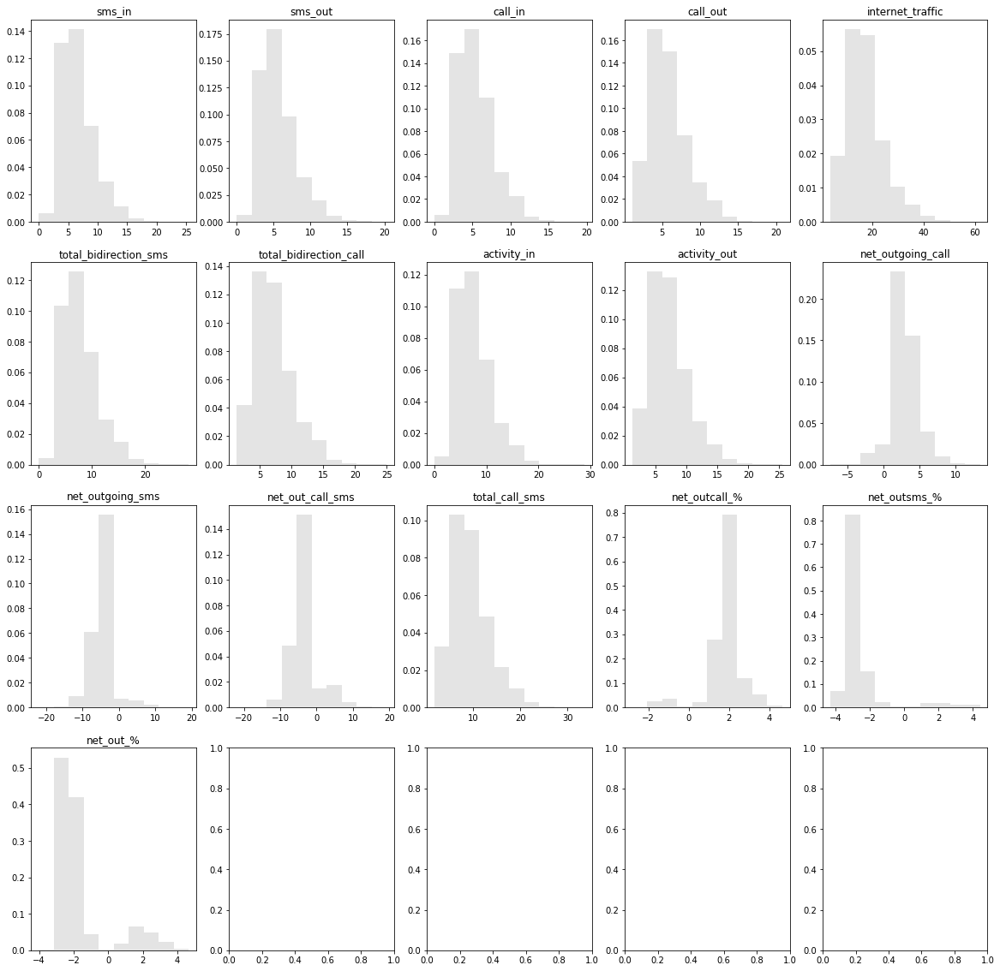

In [35]:
fig, ax = plt.subplots(nrows=4, ncols=5, figsize=(20, 20))

i = 0
j = 0
for c in col:
    ax[i, j].hist(np.cbrt(mi_total_act[c]), density=True, 
                  facecolor='lightgrey', alpha=0.6)        
    ax[i, j].set_title(c)
#     ax[i, j].set_xscale('log')
    if j == 4:
        i += 1
        j = 0
    else:
        j += 1

plt.show()

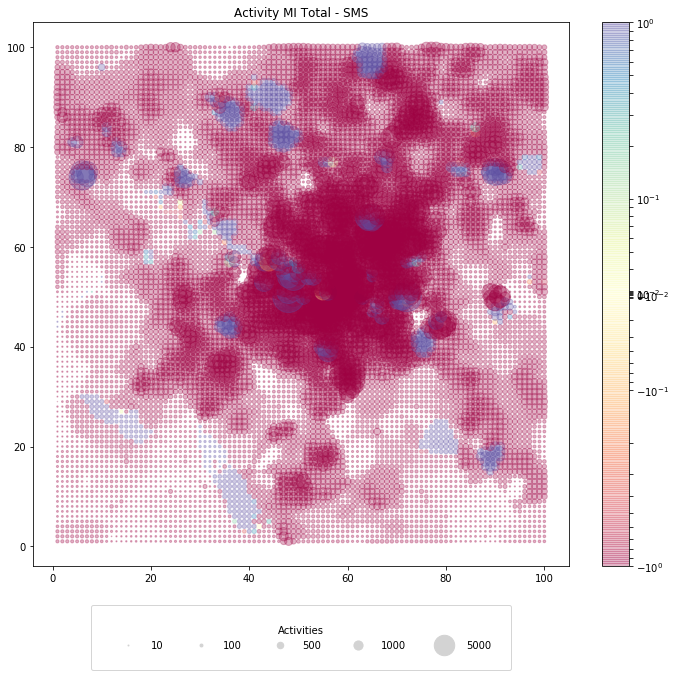

In [38]:
fig, ax = plt.subplots(figsize=(12, 10))
plot_square_coor(mi_total_act, 
                 'total_bidirection_sms', 'net_outsms_%', 
                 'Activity MI Total - SMS')
plt.show()

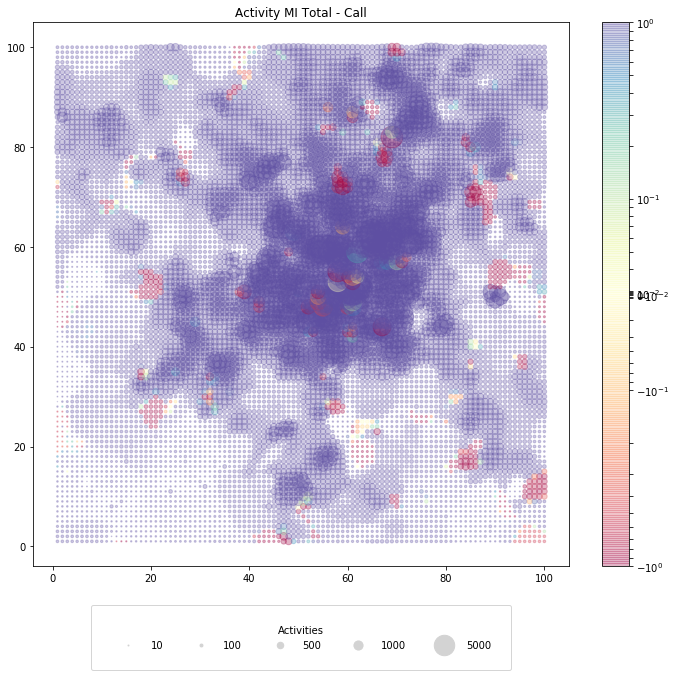

In [39]:
fig, ax = plt.subplots(figsize=(12, 10))
plot_square_coor(mi_total_act, 
                 'total_bidirection_call', 'net_outcall_%', 
                 'Activity MI Total - Call')
plt.show()

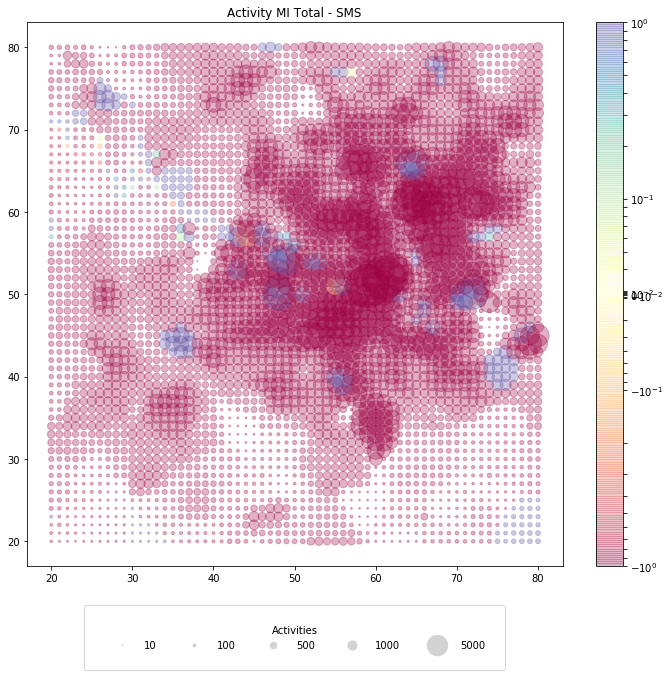

In [40]:
zoom_center = ((mi_total_act['row'] >= 20) 
               & (mi_total_act['row'] <= 80) 
               & (mi_total_act['col'] >= 20) 
               & (mi_total_act['col'] <= 80))
mi_total_zoom = mi_total_act.loc[zoom_center]

fig, ax = plt.subplots(figsize=(12, 10))
plot_square_coor(mi_total_zoom, 
                 'total_bidirection_sms', 'net_outsms_%', 
                 'Activity MI Total - SMS')
plt.show()

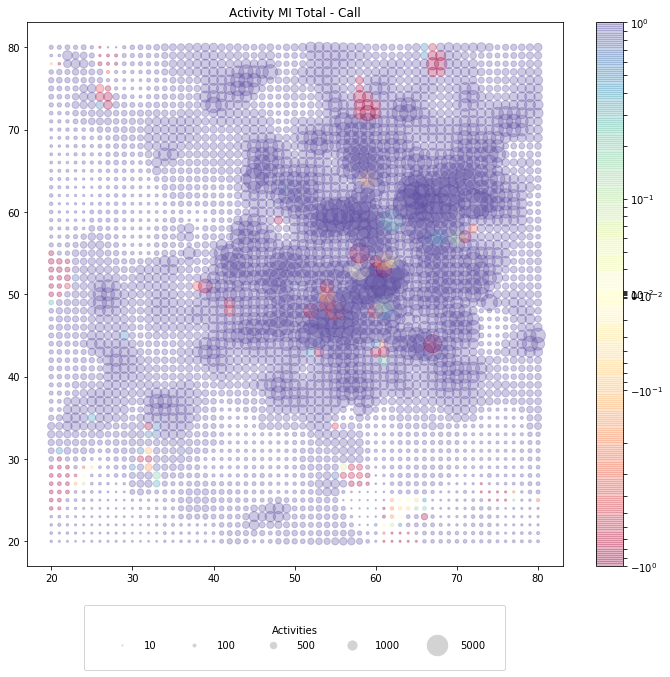

In [41]:
fig, ax = plt.subplots(figsize=(12, 10))
plot_square_coor(mi_total_zoom, 
                 'total_bidirection_call', 'net_outcall_%', 
                 'Activity MI Total - Call')
plt.show()

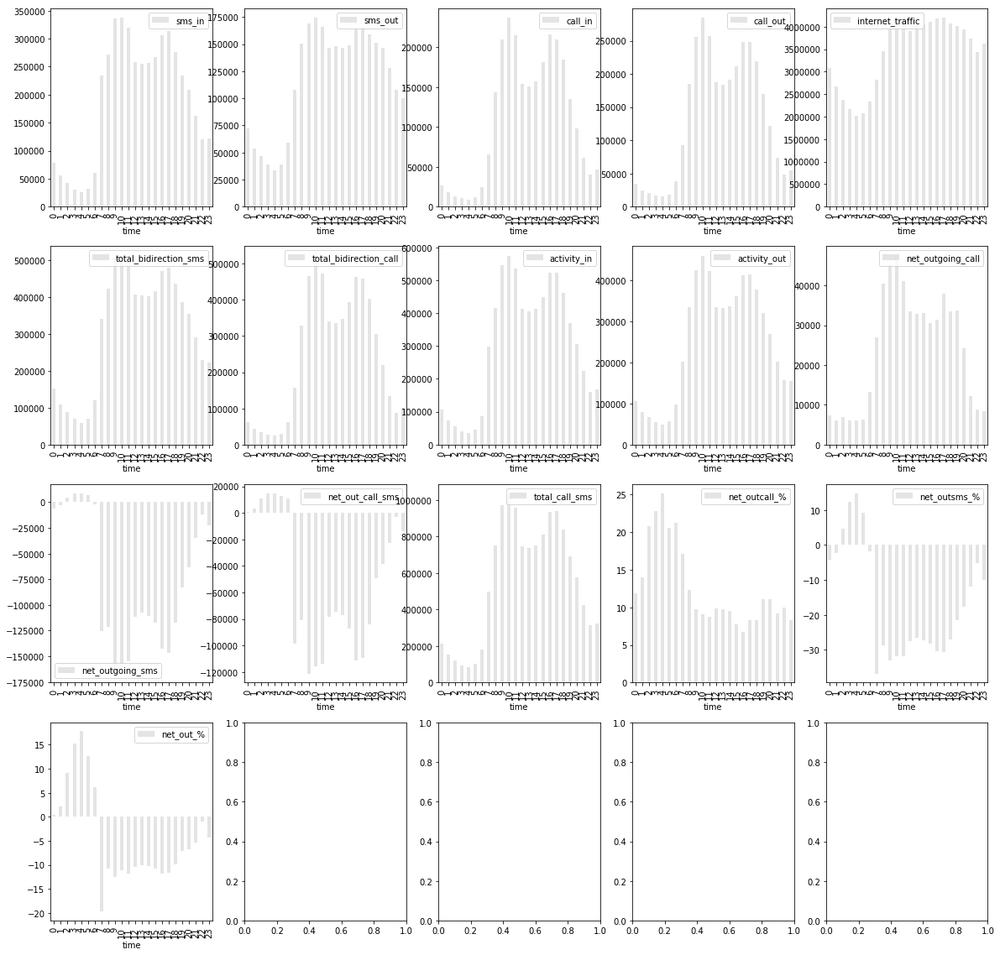

In [62]:
mi_file['time'] = mi_file['datetime'].dt.hour
mi_total_hr = mi_file.groupby('time').sum().reset_index()
mi_total_hr = net_pc_calc(mi_total_hr)

fig, ax = plt.subplots(nrows=4, ncols=5, figsize=(20, 20))

i = 0
j = 0
for c in col:
    time_hist = mi_total_hr.loc[:, ('time', c)].set_index('time')
    time_hist.plot(kind='bar', facecolor='lightgrey', 
                   alpha=0.6, ax=ax[i, j])
    if j == 4:
        i += 1
        j = 0
    else:
        j += 1

plt.show()

Next we split the data by time of day to see if there is difference in behaviour that can be used to identify work vs home for residents

In [37]:
is_mnight = (mi_file['time'] >= 24) | (mi_file['time'] < 2)
is_night = (mi_file['time'] >= 2) & (mi_file['time'] < 6)
is_work = (mi_file['time'] >= 6) & (mi_file['time'] < 21)
is_free = (mi_file['time'] >= 21) & (mi_file['time'] < 24)

mi_file.loc[is_mnight, 'time_period'] = 'mnight_hr'
mi_file.loc[is_night, 'time_period'] = 'night_hr'
mi_file.loc[is_work, 'time_period'] = 'work_hr'
mi_file.loc[is_free, 'time_period'] = 'free_hr'

display (mi_file.groupby('time_period').sum())

,square_id,time_interval,country_code,sms_in,sms_out,call_in,call_out,internet_traffic,total_bidirection_sms,total_bidirection_call,activity_in,activity_out,net_outgoing_call,net_outgoing_sms,net_out_call_sms,total_call_sms,time
time_period,,,,,,,,,,,,,,,,,
free_hr,2674160381,715968207054898944,77468247,"404,819.73","335,829.14","147,120.89","176,565.54","10,794,972.09","740,648.87","323,686.44","551,940.62","512,394.69","29,444.65","-68,990.59","-39,545.93","1,064,335.30",11351916
mnight_hr,1306594017,351775901519400000,56779350,"135,106.45","125,976.30","45,492.53","58,779.65","5,756,274.85","261,082.75","104,272.19","180,598.99","184,755.95","13,287.12","-9,130.15","4,156.97","365,354.94",119021
night_hr,2495292138,671480661698353152,77940150,"129,745.62","157,662.12","44,825.38","70,197.54","8,619,442.82","287,407.74","115,022.92","174,571.00","227,859.66","25,372.15","27,916.51","53,288.66","402,430.66",1730415
work_hr,18676756344,4959614503438970880,633273228,"3,936,715.53","2,202,962.52","2,385,361.07","2,891,219.58","57,308,556.83","6,139,678.05","5,276,580.65","6,322,076.61","5,094,182.09","505,858.51","-1,733,753.02","-1,227,894.51","11,416,258.70",46994665


As expected, most activity peak during work hour, and slowdown as the day pass. Call use gain the most during work, while in free hour people spend more on Internet activity

In [42]:
def intensity_and_density(df, cal_col, grp_col):
    """
    Calculate and return the density and intensity of activity
    """
    density = pd.DataFrame()
    intensity = pd.DataFrame()
    drop_list = df.columns.difference(cal_col+grp_col)

    df1 = df.drop(drop_list, axis=1)
    df1[cal_col] = df1[cal_col].astype(bool)
    density = df1.groupby(grp_col).sum()   
    intensity = df.groupby(grp_col).sum() / density
    
    density = density.reset_index().merge(squares_loc, 
                                          on='square_id')
    intensity = intensity.fillna(0).reset_index().merge(squares_loc, 
                                                        on='square_id')
    return density, intensity

In [43]:
cal_list = ['activity_in', 'activity_out', 'call_in', 'call_out', 
            'internet_traffic', 'sms_in', 'sms_out', 
            'total_bidirection_call', 'total_bidirection_sms', 
            'total_call_sms']
dens, inte = intensity_and_density(mi_file, cal_list, ['square_id'])

display (dens.head())
display (inte.head())

,square_id,sms_in,sms_out,call_in,call_out,internet_traffic,total_bidirection_sms,total_bidirection_call,activity_in,activity_out,total_call_sms,col,row
0,1,276.00,151.00,141.00,173.00,167.00,286.00,195.00,292.00,201.00,323.00,1,1.00
1,2,276.00,151.00,141.00,173.00,167.00,286.00,195.00,292.00,201.00,323.00,2,1.00
2,3,269.00,144.00,131.00,163.00,162.00,277.00,182.00,281.00,188.00,311.00,3,1.00
3,4,276.00,151.00,141.00,173.00,167.00,286.00,195.00,292.00,201.00,323.00,4,1.00
4,5,282.00,153.00,143.00,175.00,167.00,293.00,198.00,298.00,205.00,331.00,5,1.00


,square_id,activity_in,activity_out,call_in,call_out,country_code,internet_traffic,net_out_call_sms,net_outgoing_call,net_outgoing_sms,sms_in,sms_out,time,time_interval,total_bidirection_call,total_bidirection_sms,total_call_sms,col,row
0,1,0.41,0.47,0.29,0.28,0.00,9.02,0.00,0.00,0.00,0.29,0.30,0.00,0.00,0.46,0.44,0.66,1,1.00
1,2,0.42,0.48,0.30,0.28,0.00,9.06,0.00,0.00,0.00,0.29,0.31,0.00,0.00,0.47,0.44,0.67,2,1.00
2,3,0.44,0.52,0.32,0.31,0.00,9.38,0.00,0.00,0.00,0.30,0.33,0.00,0.00,0.51,0.46,0.71,3,1.00
3,4,0.39,0.45,0.28,0.26,0.00,8.92,0.00,0.00,0.00,0.27,0.29,0.00,0.00,0.44,0.42,0.63,4,1.00
4,5,0.36,0.41,0.26,0.24,0.00,8.12,0.00,0.00,0.00,0.25,0.27,0.00,0.00,0.40,0.38,0.58,5,1.00


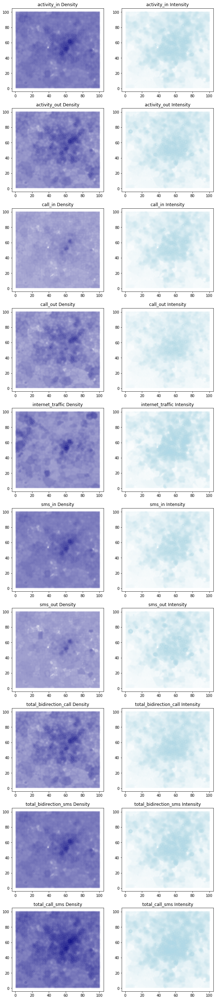

In [44]:
fig, ax = plt.subplots(ncols=2, nrows=len(cal_list), figsize=(10, 50))
for i, v in enumerate(cal_list):
    if v != 'internet_traffic': 
        i_s_adj = 4 
    else: 
        i_s_adj = 1/4
    
    ax[i, 0].scatter(x=dens['col'], y=dens['row'], 
                     s=dens[v]/32, c='navy', alpha=0.2)
    ax[i, 1].scatter(x=inte['col'], y=inte['row'], 
                     s=inte[v]*i_s_adj, c='lightblue', alpha=0.2)
    ax[i, 0].set_title(v+' Density')
    ax[i, 1].set_title(v+' Intensity')
    
plt.show()

In [45]:
np.corrcoef(mi_total_act['total_bidirection_sms'],
            mi_total_act['total_bidirection_call'])

array([[1.        , 0.95169326],
       [0.95169326, 1.        ]])

In [46]:
np.corrcoef(mi_total_act['net_outcall_%'],
            mi_total_act['net_outsms_%'])

array([[ 1.        , -0.04933402],
       [-0.04933402,  1.        ]])

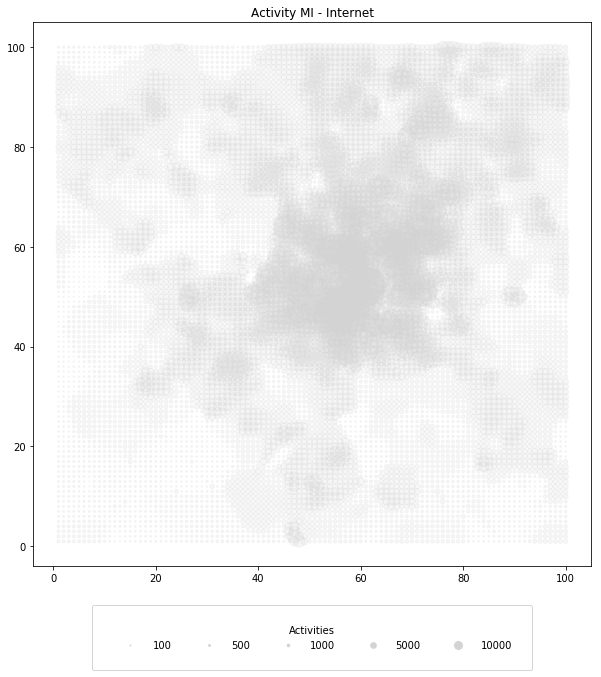

In [47]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.scatter(x=mi_total_act['col'], 
            y=mi_total_act['row'], 
            s=mi_total_act['internet_traffic']/160, 
            c='lightgrey', alpha=0.2)
plt.title('Activity MI - Internet')
legend_label = [100, 500, 1000, 5000, 10000]
legend_box = [plt.scatter([], [], 
                          s=i/160, c='lightgrey') for i in legend_label]
plt.legend(legend_box, legend_label, bbox_to_anchor=(0.5, -0.2), 
           ncol=5, handlelength=3.5, loc=8, borderpad=2, 
           handletextpad=0.5, title='Activities'
          )
plt.show()

In [48]:
period = ['mnight_hr', 'night_hr', 'work_hr', 'free_hr']
hr_map, mi_by_hr = map_to_square(mi_file, ['time_period'], period)

mi_by_hr.head()

,square_id,time_period,time_interval,country_code,sms_in,sms_out,call_in,call_out,internet_traffic,total_bidirection_sms,total_bidirection_call,activity_in,activity_out,net_outgoing_call,net_outgoing_sms,net_out_call_sms,total_call_sms,time
0,1,free_hr,53949321600000,1143,7.26,4.57,1.73,2.25,175.56,11.83,3.97,8.99,6.81,0.52,-2.70,-2.18,15.80,859
1,1,mnight_hr,26282074800000,517,1.58,1.07,0.22,0.33,85.25,2.65,0.55,1.80,1.40,0.11,-0.51,-0.40,3.20,8
2,1,night_hr,48414759600000,1022,1.89,1.72,0.25,0.39,134.66,3.61,0.65,2.14,2.11,0.14,-0.17,-0.03,4.25,129
3,1,work_hr,349978108800000,12308,67.98,38.53,38.91,45.27,"1,111.57",106.51,84.19,106.89,83.81,6.36,-29.45,-23.09,190.70,3315
4,2,free_hr,53949321600000,1143,7.40,4.62,1.76,2.30,175.93,12.01,4.06,9.15,6.92,0.54,-2.78,-2.24,16.07,859


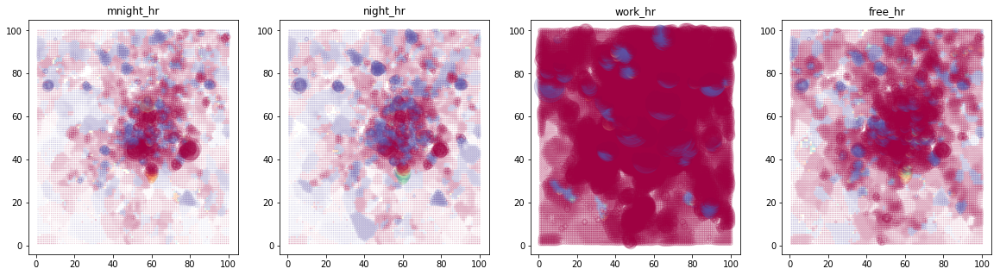

In [49]:
fig, ax = plt.subplots(ncols=len(period), figsize=(20, 5))
plot_map(hr_map, 'total_bidirection_sms', 'net_outsms_%', period)
plt.show()

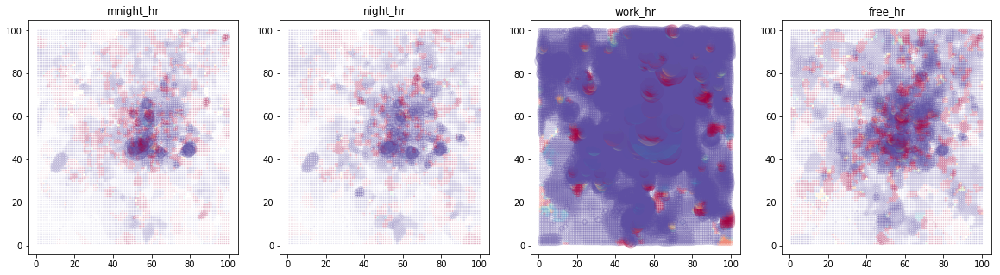

In [50]:
fig, ax = plt.subplots(ncols=len(period), figsize=(20, 5))
plot_map(hr_map, 'total_bidirection_call', 'net_outcall_%', period)
plt.show()

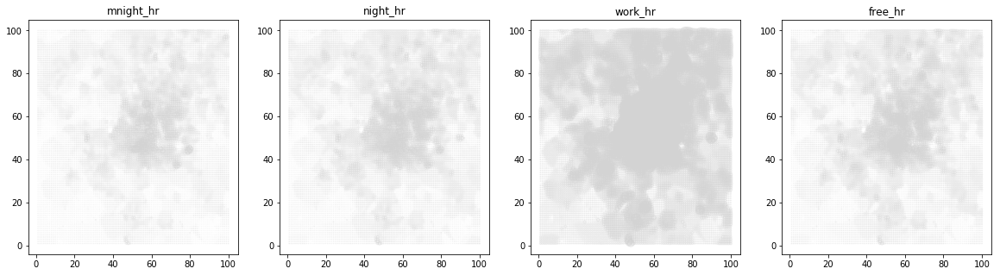

In [51]:
fig, ax = plt.subplots(ncols=len(period), figsize=(20, 5))
plot_map_internet(hr_map, period, 240)
plt.show()

In [52]:
for p in period:
    hr_map[p].fillna(0, inplace = True)
    
for p in period:
    print (p)
    print (np.corrcoef(hr_map[p]['total_bidirection_call'], 
                       hr_map[p]['total_bidirection_sms']))
    print (np.corrcoef(hr_map[p]['net_outcall_%'], 
                       hr_map[p]['net_outsms_%']))

mnight_hr
[[1.         0.83314681]
 [0.83314681 1.        ]]
[[ 1.         -0.06317007]
 [-0.06317007  1.        ]]
night_hr
[[1.         0.60707206]
 [0.60707206 1.        ]]
[[1.         0.05989671]
 [0.05989671 1.        ]]
work_hr
[[1.         0.96527285]
 [0.96527285 1.        ]]
[[ 1.         -0.08951609]
 [-0.08951609  1.        ]]
free_hr
[[1.         0.90603456]
 [0.90603456 1.        ]]
[[1.         0.00699483]
 [0.00699483 1.        ]]


In [53]:
var_set = ['net_outcall_%', 'net_outsms_%', 'internet_traffic', 
           'total_bidirection_call', 'total_bidirection_sms']

for var in var_set:
    name_list = [var + '_' + s for s in period]
    c_sec = pd.concat([hr_map[p][var] for p in period], axis=1)
    c_sec.columns = name_list
    display (c_sec.corr())

,net_outcall_%_mnight_hr,net_outcall_%_night_hr,net_outcall_%_work_hr,net_outcall_%_free_hr
net_outcall_%_mnight_hr,1.00,0.34,0.22,0.27
net_outcall_%_night_hr,0.34,1.00,0.29,0.27
net_outcall_%_work_hr,0.22,0.29,1.00,0.51
net_outcall_%_free_hr,0.27,0.27,0.51,1.00


,net_outsms_%_mnight_hr,net_outsms_%_night_hr,net_outsms_%_work_hr,net_outsms_%_free_hr
net_outsms_%_mnight_hr,1.00,0.51,0.53,0.58
net_outsms_%_night_hr,0.51,1.00,0.53,0.48
net_outsms_%_work_hr,0.53,0.53,1.00,0.68
net_outsms_%_free_hr,0.58,0.48,0.68,1.00


,internet_traffic_mnight_hr,internet_traffic_night_hr,internet_traffic_work_hr,internet_traffic_free_hr
internet_traffic_mnight_hr,1.00,0.96,0.82,0.92
internet_traffic_night_hr,0.96,1.00,0.90,0.95
internet_traffic_work_hr,0.82,0.90,1.00,0.92
internet_traffic_free_hr,0.92,0.95,0.92,1.00


,total_bidirection_call_mnight_hr,total_bidirection_call_night_hr,total_bidirection_call_work_hr,total_bidirection_call_free_hr
total_bidirection_call_mnight_hr,1.00,0.92,0.31,0.65
total_bidirection_call_night_hr,0.92,1.00,0.46,0.68
total_bidirection_call_work_hr,0.31,0.46,1.00,0.82
total_bidirection_call_free_hr,0.65,0.68,0.82,1.00


,total_bidirection_sms_mnight_hr,total_bidirection_sms_night_hr,total_bidirection_sms_work_hr,total_bidirection_sms_free_hr
total_bidirection_sms_mnight_hr,1.00,0.86,0.43,0.68
total_bidirection_sms_night_hr,0.86,1.00,0.54,0.70
total_bidirection_sms_work_hr,0.43,0.54,1.00,0.85
total_bidirection_sms_free_hr,0.68,0.70,0.85,1.00


/Users/admin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/admin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """
/Users/admin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

mnight_hr


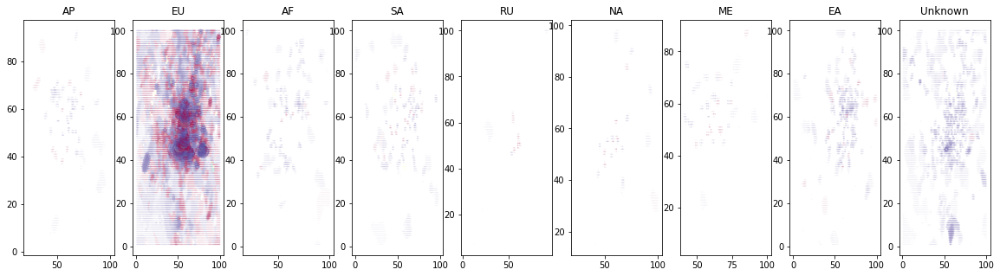

night_hr


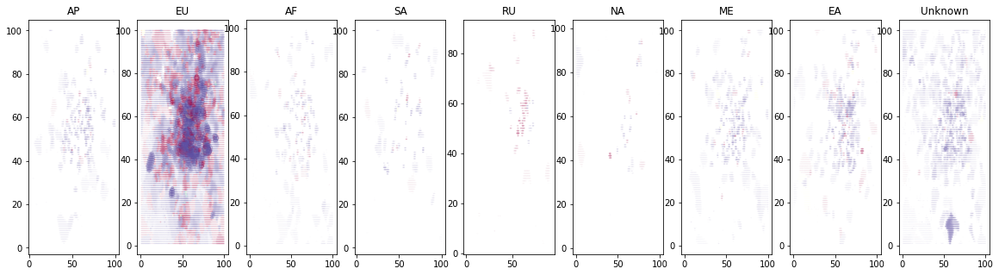

work_hr


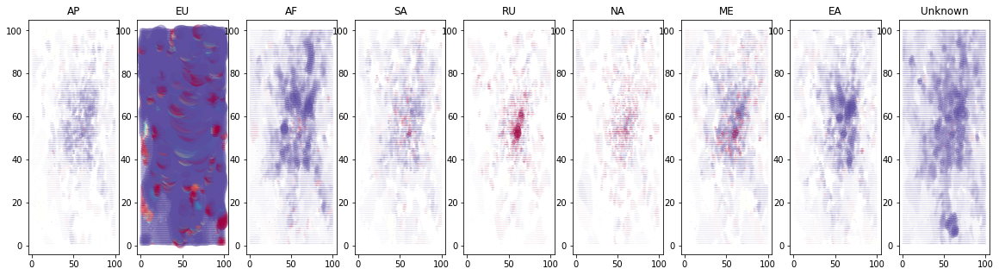

free_hr


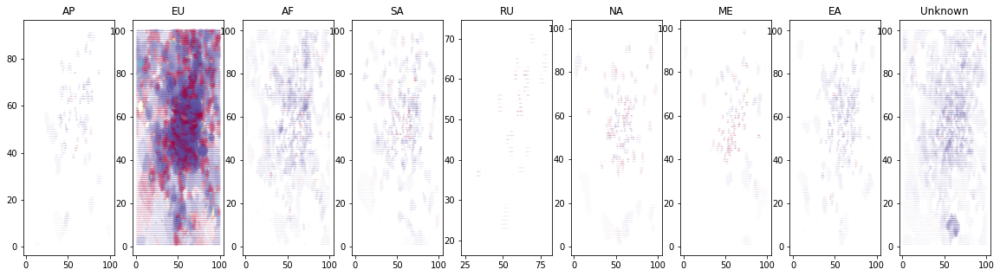

In [54]:
ctr_hr_map, mi_by_ct_hr = map_to_square(mi_file, 
                                        ['time_period', 'country'], period)

for p in period:
    ctr_by_hr, mi_ct_by_hr = map_to_square(ctr_hr_map[p], 
                                           ['country'], country)
    print (p)
    fig, ax = plt.subplots(ncols=len(country_u), figsize=(20, 5))
    plot_map(ctr_by_hr, 'total_bidirection_call', 'net_outcall_%', country_u)
    plt.show()